In [1]:
from __future__ import division
import numpy as np
from numpy import pi, diagflat, arange
from numpy import linalg as LA
from scipy import sqrt, exp, cos, matrix, vstack, hstack, zeros
from scipy.linalg import block_diag
import matplotlib.pyplot as plt
import pickle
import mpld3
import math as m
import cmath
import pandas as pd

# Filter design for three phase inverters


Let us first define some quantities, that are: 

\begin{equation}
Z_b=\dfrac{U_n^2}{P_{rated}}
\end{equation}


\begin{equation}
L_b=\dfrac{Z_b}{\omega_0}
\end{equation}


\begin{equation}
C_b=\dfrac{1}{\omega_0 Z_b}
\end{equation}
where,

$U_n$ is the line-to-line rms voltage, V

$f_o$ grid frequency, Hz

$\omega_0$  grid frequency, rad/s

$P_{rated}$ is the active rated power, W.

$S_{sc}$ Short circuit power at the point of connection, MVA.

Some addtional quantities will also be required for the design that are:

$f_s$  switching frequency - also considered the frequency of the first group of high frequency harmonics, Hz

$U_{dc}$ Dc bus voltage, V

$I_{ref}$ peak value of the nominal current, A.




In [2]:
# ##### Enter the paramters here #####
####################################

V_line=380;      # line-to-line voltage (V)
fo=60;           # grid frequency (Hz)
w0= 2*m.pi*fo;   # grid frequency (rad/s)
P_rated=100e3;   # Active inverter rated power (W)
S_sc=10*P_rated/1000000   # short-circuit power (MVA) for a SCR=10
fs=10000;        # Switching frequency
Udc=800;         # DC bus voltage (V)


Irated=m.sqrt(2)*P_rated/(m.sqrt(3)*V_line);

Zb=V_line*V_line/P_rated;
Lb=Zb/w0
Cb=1/(w0*Zb)

# LCL filter Design

Considering [1-3] the following aspects should be take into account for the LCL filter design:

The maximum total per phase inductance should be less than 0.1 pu to limit the ac voltage droop during operation.

The resonance frequency of the filter must be in a range between ten times the line frequency and one-half of the switching frequency.

The filter capacitance should be less than 10% of the base impedance to limit the reactive power.

The converter side inductor is designed to limit the maximum current ripple which is associated with the inductor and power semiconductor losses.

# Design Procedure

### Step 1:


In a three-phase inverter the ripple on the inverter side inductor varies along the fundamental period and depends on the modulation strategy adopted. 

For a three phase two level inverter the inverter side inductance can be calculated in accordance with:

\begin{equation}
L_1  \ge \dfrac{U_{dc}}{8f_s \left(\beta I_{rated}\right)}
\end{equation}

where, $I_{rated}$ is the rated reference peak current, $\beta$ is the inverter-side current ripple ratio, which is usually smaller than 40% in order to limit the conduction and switching loses on the power semiconductor devices.   $f_s$ is the switching frequency.

Simailarly, for a three level three phase inverter, L1 can be found as:
\begin{equation}
L_1  \ge \dfrac{U_{dc}}{16f_s \left(\beta I_{rated}\right)}
\end{equation}

### Step 2

Select the capacitance 


\begin{equation}
C_f \le 0.1 C_b
\end{equation}

This selection aims to limit the reactive power associated to the capacitor at fundamental frequency to be smaller than 10%  of the inverter rated power. 


### Step 3 
Selection of $L_2$

The inductance $L_2$ should be selected to attenuate the high order harmonics around the switching frequency. In [1] these harmonics are limited to 0.3% of the rated current, in [4] different standards and grid codes are considered. 



## Design  Example: LCL Filter

Let us start by defining $L_1$ and $C_f$ as: 

\begin{equation}
L_1  = \dfrac{U_{dc}}{8f_s \left(\beta I_{rated}\right)}
\end{equation}
or for a three level inverter

\begin{equation}
L_1  = \dfrac{U_{dc}}{16f_s \left(\beta I_{rated}\right)}
\end{equation}

\begin{equation}
C_f = 0.1 C_b
\end{equation}

### Step 1: Slection of $L_1$

Now, let us define the current ripple on the inverter side inductor by means of the parameter $\beta$, that is:

In [3]:
# Step 1
ripple=30;
beta=ripple/100;
# Compute L1
L1 = Udc/(8*fs*beta*Irated) # select his line for two level Converter
##L1 = Udc/(16*fs*beta*Irated) # select this line for three level Converter

### Step 2: Selection of $C_f$


The filter capacitance is obtained mutiplying the base capacitance by a value $\le$ 10% 

In [4]:
# Step 2

Cf=Cb*0.1

print("L1=", repr(round(L1*1000,2)), 'mH')
print("Cf=", repr(round(Cf*1000000,2)), 'uF')   



L1= 0.16 mH
Cf= 183.7 uF


### Step 3: Selection of $L_2$
To define the grid side inductor $L_2$, let us look the equivalent circuit for the high oder harmonics, that is:

![](LCfilter_design.jpg)

From the equivalent circuit it is possible to find that:

\begin{equation}
{i_{ga}}(s) = \frac{1}{{3C_f{L_1}{L_2}s \left( {s^2} + \frac{{{L_1} + {L_2}}}{{C_f{L_1}{L_2}}} \right)}} \left(2v{}_{ab}(s) + {v_{bc}}(s)\right).
\end{equation}

For a given frenquecy, the grid harmonic current of phase $a$ can be expressed as:
$$
{i_{ga}}(j\omega ) = \frac{1}{{3C_f{L_1}{L_2} \left(j\omega\right) \left( - {\omega ^2} + \frac{{{L_1} + {L_2}}}{{C_f{L_1}{L_2}}}\right)}}(2v{}_{ab}(j\omega ) + {v_{bc}}(j\omega )).$$
As a result the magnitute of the grid side harmonics are:
$$
\left| {{i_{ga}}(j\omega )} \right| = \frac{1}{{\left| {3C_f{L_1}{L_2}\omega \left({\omega ^2} - \frac{{{L_1} + {L_2}}}{{C_f{L_1}{L_2}}}\right)} \right|}}\left| {2v{}_{ab}(j\omega ) + {v_{bc}}(j\omega )} \right|$$
 therefore
 $$
\left| {3C_f{L_1}{L_2}\omega \left({\omega ^2} - \frac{{{L_1} + {L_2}}}{{C_f{L_1}{L_2}}}\right)} \right| = \frac{{\left| {2v{}_{ab}(j\omega ) + {v_{bc}}(j\omega )} \right|}}{{\left| {{i_{ga}}(j\omega )} \right|}}  .$$

For frequencies above the $LCL$  resonant frequency it is possible to write:

$$3C_f{L_1}{L_2}\omega_h \left({\omega_h ^2} - \frac{{{L_1} + {L_2}}}{{C_f{L_1}{L_2}}}\right) = \eta (\omega _h,I_h)$$
where
$$\eta (\omega _h,I_h) = \frac{{{\left| {(2{v_{ab}}(j{\omega _h}) + {v_{bc}}(j\omega {}_h))} \right|}}}{{ {I_h}}}.$$

The peak value of the current harmonics, $I_h$, should be limited to meet the consided grid code. For instance, the BDEW Technical Guideline for Generating Plants Connected to the Medium-Voltage Network [4] establishes limits for hamonic and interharmonic currents of order $h>40$ when conecting to a medium-voltage network. For a $20kV$ network the following limit are set:
$$ I_h\le \sqrt{2}\frac{0.09S_{sc}}{h} \frac {20000}{V_{line}}.$$
It should be mentioned that, here, the harmonic currents have been reflected to the low voltage side of the medium voltage transformer.

By solving the above equations for $L_2$ results:

$${L_2} = \max(\frac{{\eta (\omega _h,I_h)  + 3{L_1}\omega_h }}{{3C_f{L_1}{\omega_h ^3} - 3\omega_h }}).$$

Let us now start the filter desing importing the voltages vab and vbc from the Typhoon HIL scada.

Text(0, 0.5, 'Vbc (V)')

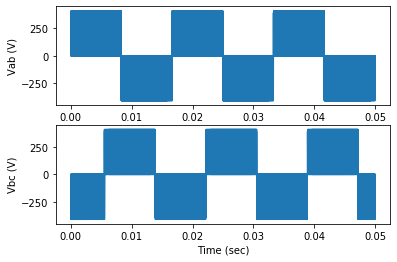

In [5]:
voltages = pd.read_csv('HIL_190220_162534.csv')

vab=voltages.loc[:, "Vab"] 
vbc=voltages.loc[:, "Vbc"]

plt.subplot(2, 1, 1)
plt.plot(voltages.loc[:, "Time"],voltages.loc[:, "Vab"])
plt.xlabel("Time (sec)")
plt.ylabel("Vab (V)")
plt.subplot(2, 1, 2)
plt.plot(voltages.loc[:, "Time"],voltages.loc[:, "Vbc"])
plt.xlabel("Time (sec)")
plt.ylabel("Vbc (V)")


Compute the harmonics of the $\left(2v_{ab}+v_{bc}\right)$



Sampling time = 1.0 us
fft time window = 49.999 ms


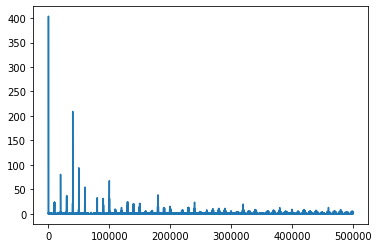

In [6]:
time = voltages.loc[:, "Time"]
f_s = 1/(time[2]-time[1])
line_voltage = 2*vab+1*vbc
fft_vab = np.fft.fft(line_voltage)
n = len(fft_vab)
fft_x1 = fft_vab[0:int(len(fft_vab)/2)]/(n/2) 
n2 = len(fft_x1)
freq = np.fft.fftfreq(n, 1/f_s)
freq1 = freq[0:int(len(freq)/2)]
mpld3.enable_notebook()
plt.plot(freq1,np.abs(fft_x1))
print('Sampling time =',repr(round(1/f_s*1000000)), 'us')
print('fft time window =', repr(round((np.max(time)-np.min(time))*1000,3)),'ms')

Now let us find L2

Frequency range considered for the L2 design
f_min= 9.6 kHz         f_max= 112.78 kHz
L2= 0.03 mH


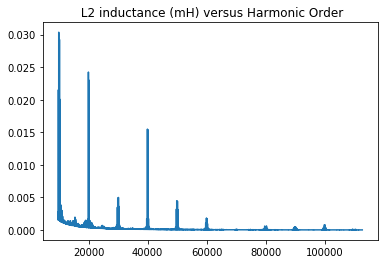

In [7]:
N_cap= 12 ##  number of fundamental cycles captured from HIL Scada
h_from=N_cap*40
h_to=N_cap*470
omega=2*np.pi*freq[h_from:h_to]
I_h=np.sqrt(2)*0.09*S_sc*20000/V_line/(omega/(2*np.pi*60))
Sum2VabVbch=np.abs(fft_x1[h_from:h_to])
eta=Sum2VabVbch/I_h
L2_h=(eta+3*L1*omega)/(3*Cf*L1*omega*omega*omega-3*omega)
plt.plot(omega/2/np.pi,L2_h*1000)
plt.title(' L2 inductance (mH) versus Harmonic Order')
L2=np.max(L2_h)
print ( 'Frequency range considered for the L2 design')
print ('f_min=',repr(round(np.min(omega/2/np.pi)/1000,2)),'kHz','        f_max=',repr(round(np.max(omega/2/np.pi)/1000,2)),'kHz')
print('L2=',repr(round(L2*1000,2)),'mH')


Text(0.5, 1.0, ' Grid Current Harmonics Limit (A) versus Harmonic Order')

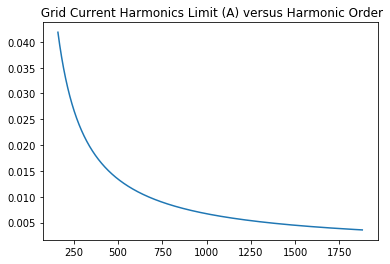

In [8]:
plt.plot(omega/2/np.pi/60,I_h)
plt.title(' Grid Current Harmonics Limit (A) versus Harmonic Order')

### The inverter with LCL filter main parameters are:

In [9]:
print('Nominal Power ',repr(round(P_rated/1000,2)), 'kW')
print('Nominal Voltage',repr(round(V_line,2)), 'V')
print('Grid nominal frequecy',repr(round(fo,2)), 'Hz')
print('Dc bus voltage',repr(round(Udc,2)), 'V')
print('Switching frequency,  fsw=',repr(round(fs/1000,2)), 'kHz')
print('Inverter current ripple   ', repr(round(beta*100,4)), '%')
print('L1=', repr(round(L1*1000,2)), 'mH')
print('Cf=', repr(round(Cf*1000000,2)),'uF')
print('L2=', repr(round(L2*1000,2)), 'mH')
print('LCL resonant frequency fr=',repr(round(np.sqrt((L2+L1)/(L1*L2*Cf))/2/np.pi/1000,2)), 'kHz')
print ('Total inductance per phase,',repr(round((L1+L2)/Lb,2)),'pu')
print ('Capacitance per phase, ',repr(round(Cf/Cb,2)),'pu')

Nominal Power  100.0 kW
Nominal Voltage 380 V
Grid nominal frequecy 60 Hz
Dc bus voltage 800 V
Switching frequency,  fsw= 10.0 kHz
Inverter current ripple    30.0 %
L1= 0.16 mH
Cf= 183.7 uF
L2= 0.03 mH
LCL resonant frequency fr= 2.33 kHz
Total inductance per phase, 0.05 pu
Capacitance per phase,  0.1 pu


### Design validation

Run a HIL simulation with the designed filter parameters and import the current waveform from the HIL scada, compute the spectrum then, compare with the considered current limit.

Text(0.5, 1.0, 'Grid current spectrum (A) and Selected acceptable Current Limit (A)')

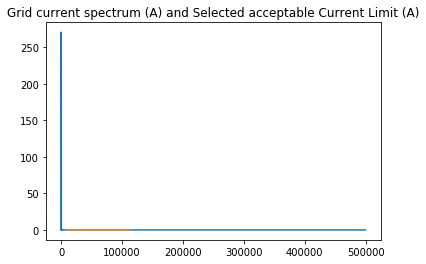

In [10]:
currents = pd.read_csv('HIL_190213_194812.csv')

iga=currents.loc[:, "Ia2"] 
ia_inv=currents.loc[:, "Ia1"] 


fft_iga = np.fft.fft(iga)
n = len(fft_iga)
fft_x2 = fft_iga[0:int(len(fft_iga)/2)]/(n/2) 
n3 = len(fft_x2)
freq = np.fft.fftfreq(n, 1/f_s)
freq1 = freq[0:int(len(freq)/2)]
mpld3.enable_notebook()
plt.plot(freq1,np.abs(fft_x2),omega/2/np.pi,I_h)
plt.title('Grid current spectrum (A) and Selected acceptable Current Limit (A)')

Text(0.5, 1.0, 'Inverter Side Current (A)')

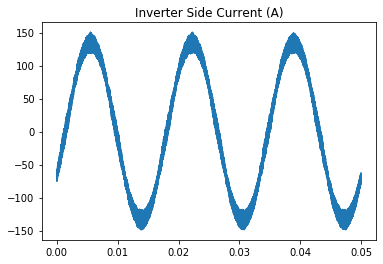

In [11]:
plt.plot(voltages.loc[:, "Time"],voltages.loc[:, "Ia1"])
plt.title('Inverter Side Current (A)')

In [12]:
beta_real=(65-(-10))/Irated
print('beta measured =', repr(round(beta_real,3)), '     Designed beta =',beta)


beta measured = 0.349      Designed beta = 0.3


To compute the current harmonics at and  below the LCL filter resonance frequency the current controller  should be take into consideration.

## References

[1] IEEE Standard for Interconnecting Distributed Resources with Electric Power Systems," in IEEE Std 1547-2003 , vol., no., pp.1-28, 28 July 2003. doi: 10.1109/IEEESTD.2003.94285

[2] M. Huang, F. Blaabjerg, Y. Yang and W. Wu, "Step by step design of a high order power filter for three-phase three-wire grid-connected inverter in renewable energy system," 2013 4th IEEE International Symposium on Power Electronics for Distributed Generation Systems (PEDG), Rogers, AR, 2013, pp. 1-8. doi: 10.1109/PEDG.2013.6785603.

[3] M. Liserre, F. Blaabjerg and S. Hansen, "Design and control of an LCL-filter-based three-phase active rectifier," in IEEE Transactions on Industry Applications, vol. 41, no. 5, pp. 1281-1291, Sept.-Oct. 2005. doi: 10.1109/TIA.2005.853373

[4]R. Burkart, J. W. Kolar, Overview and Comparison of Grid Harmonics and Conducted EMI Standards for LV Converters Connected to the MV Distribution System, Proceedings of the first Power Electronics South America 2012.

